# New York City Hotels Data Analysis

In [2]:
#Importing the necessary packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px
from scipy.stats import norm

# Loading the dataset

New York City Hotel information dataset

In [5]:
#loading the dataset using pandas
df = pd.read_csv('New_York_Listings_2024.csv')
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,...,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,bedrooms,beds,baths
0,1312228,Rental unit in Brooklyn · ★5.0 · 1 bedroom,7130382,Walter,Brooklyn,Clinton Hill,40.683710,-73.964610,Private room,55,...,20/12/15,0.03,1,0,0,No License,5,1,1,Not specified
1,45277537,Rental unit in New York · ★4.67 · 2 bedrooms ·...,51501835,Jeniffer,Manhattan,Hell's Kitchen,40.766610,-73.988100,Entire home/apt,144,...,01/05/23,0.24,139,364,2,No License,4.67,2,1,1
2,971353993633883038,Rental unit in New York · ★4.17 · 1 bedroom · ...,528871354,Joshua,Manhattan,Chelsea,40.750764,-73.994605,Entire home/apt,187,...,18/12/23,1.67,1,343,6,Exempt,4.17,1,2,1
3,3857863,Rental unit in New York · ★4.64 · 1 bedroom · ...,19902271,John And Catherine,Manhattan,Washington Heights,40.835600,-73.942500,Private room,120,...,17/09/23,1.38,2,363,12,No License,4.64,1,1,1
4,40896611,Condo in New York · ★4.91 · Studio · 1 bed · 1...,61391963,Stay With Vibe,Manhattan,Murray Hill,40.751120,-73.978600,Entire home/apt,85,...,03/12/23,0.24,133,335,3,No License,4.91,Studio,1,1


# Description about the data

__Overview of the data__  
__id__: A unique identifier for each listing.  
__name__: The title or name of the hotel listed by the host.  
__host_id__: A unique identifier assigned to the host who listed the hotel.  
__host_name__: The name of the person who hosts the hotel.  
__neighbourhood_group__: The broader area or region where the property is located, such as a city district or zone.  
__neighbourhood__: The specific neighborhood within the broader region where the property is located.  
__latitude__: The latitude coordinate of the hotel’s location, used for mapping and geographic analysis.  
__longitude__: The longitude coordinate of the hotel’s location, used for mapping and geographic analysis.  
__room_type__: The type of room offered in the listing, such as “Entire home/apt,” “Private room,” or “Shared room.”  
__price__: The cost per night for staying at the property in the local currency, which is in dollars.  
__minimum_nights__: The minimum number of nights a guest is required to book the property for a stay.  
__number_of_reviews__: The total number of reviews the hotel has received from guests.  
__last_review__: The date of the most recent review received by the listing.  
__reviews_per_month__: The average number of reviews the hotel receives per month.  
__calculated_host_listings_count__: The total number of active listings the host has on the platform.  
__availability_365__: The number of days the hotel is available for booking within a year (365 days).  
__number_of_reviews_ltm__: The number of reviews received over the last 12 months, also known as "last twelve months" (LTM) reviews.  
__license__: The property’s registration or license number, if required by local authorities.  
__rating__: The overall rating of the hotel, often based on guest reviews.  
__bedrooms__: The number of bedrooms available in the hotel.  
__beds__: The number of beds available in the hotel.  
__baths__: The number of bathrooms available in the hotel.  
These fields are typical for accomodation and hospitality dataset of New York city, giving a comprehensive   
view of the hotel name, location, host, pricing, availability, and guest feedback.  


In [8]:
#Checking the info of the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20758 entries, 0 to 20757
Data columns (total 22 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              20758 non-null  int64  
 1   name                            20758 non-null  object 
 2   host_id                         20758 non-null  int64  
 3   host_name                       20758 non-null  object 
 4   neighbourhood_group             20758 non-null  object 
 5   neighbourhood                   20758 non-null  object 
 6   latitude                        20758 non-null  float64
 7   longitude                       20758 non-null  float64
 8   room_type                       20758 non-null  object 
 9   price                           20758 non-null  int64  
 10  minimum_nights                  20758 non-null  int64  
 11  number_of_reviews               20758 non-null  int64  
 12  last_review                     

From the above information we would say that there are overall __20758 rows__ form __0 to 20757__  
and __22 columns__. The table provides us the clearly about the dataset that there is no null value in   
nay of the column, all entries are filled with values, the next attribute gievs the information about the   
datatype of the column within the dataset separately as well as we found in the last about the total count   
of hte datatypes. We find that the total columns with __float - 3__, __integer - 9__, __object - 10__.  
The memory usage of this dataset is more than __3.5+ MB__.

In [10]:
#finding the shape of the data
df.shape

(20758, 22)

By finding the shape of the data, we state that there are __20758 rows__ and __22 columns__.

In [12]:
#Describing the data
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,beds
count,2.075800e+04,2.075800e+04,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000
mean,3.034044e+17,1.749316e+08,40.726798,-73.939161,187.776616,28.558435,42.642596,1.257910,18.844108,205.990317,10.852105,1.723721
std,3.901216e+17,1.725541e+08,0.060294,0.061403,1022.797208,33.536518,73.561654,1.904661,70.910834,135.087768,21.357071,1.212272
min,2.595000e+03,1.678000e+03,40.500314,-74.249840,10.000000,1.000000,1.000000,0.010000,1.000000,0.000000,0.000000,1.000000
25%,2.708808e+07,2.041738e+07,40.684150,-73.980710,80.000000,30.000000,4.000000,0.210000,1.000000,87.000000,1.000000,1.000000
50%,4.993003e+07,1.087271e+08,40.722820,-73.949587,125.000000,30.000000,14.000000,0.650000,2.000000,215.000000,3.000000,1.000000
75%,7.216019e+17,3.144102e+08,40.763098,-73.917460,199.000000,30.000000,49.000000,1.800000,5.000000,353.000000,15.000000,2.000000
max,1.054376e+18,5.504035e+08,40.911147,-73.713650,100000.000000,1250.000000,1865.000000,75.490000,713.000000,365.000000,1075.000000,42.000000


By describing the data, we fetch 
__mean, count, standard deveiation, minimum, maximum
first quartile, median, third quartile__
for each column which is numeric.

In [14]:
#Converting the total columns into list further use
df_columns = df.columns.to_list()
df_columns

['id',
 'name',
 'host_id',
 'host_name',
 'neighbourhood_group',
 'neighbourhood',
 'latitude',
 'longitude',
 'room_type',
 'price',
 'minimum_nights',
 'number_of_reviews',
 'last_review',
 'reviews_per_month',
 'calculated_host_listings_count',
 'availability_365',
 'number_of_reviews_ltm',
 'license',
 'rating',
 'bedrooms',
 'beds',
 'baths']

The above list denotes the every column heading.  

In [16]:
#Identifying Missing Data
df.isnull().sum()

id                                0
name                              0
host_id                           0
host_name                         0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
number_of_reviews_ltm             0
license                           0
rating                            0
bedrooms                          0
beds                              0
baths                             0
dtype: int64

There are __no null values__ in the any column in the data.

# Cleaning the data

- First of all check all the columns data whether the data in each is in a proper manner or not,  
if the data is in not useful way try to drop it from the table.  
- Starting from first coulmn try to analyse each column to find any descripency to avoid.  
- Changing the datatype of columns which are in object.

In [20]:
#Checking whether the column is dropped or not
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,...,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,bedrooms,beds,baths
0,1312228,Rental unit in Brooklyn · ★5.0 · 1 bedroom,7130382,Walter,Brooklyn,Clinton Hill,40.683710,-73.964610,Private room,55,...,20/12/15,0.03,1,0,0,No License,5,1,1,Not specified
1,45277537,Rental unit in New York · ★4.67 · 2 bedrooms ·...,51501835,Jeniffer,Manhattan,Hell's Kitchen,40.766610,-73.988100,Entire home/apt,144,...,01/05/23,0.24,139,364,2,No License,4.67,2,1,1
2,971353993633883038,Rental unit in New York · ★4.17 · 1 bedroom · ...,528871354,Joshua,Manhattan,Chelsea,40.750764,-73.994605,Entire home/apt,187,...,18/12/23,1.67,1,343,6,Exempt,4.17,1,2,1
3,3857863,Rental unit in New York · ★4.64 · 1 bedroom · ...,19902271,John And Catherine,Manhattan,Washington Heights,40.835600,-73.942500,Private room,120,...,17/09/23,1.38,2,363,12,No License,4.64,1,1,1
4,40896611,Condo in New York · ★4.91 · Studio · 1 bed · 1...,61391963,Stay With Vibe,Manhattan,Murray Hill,40.751120,-73.978600,Entire home/apt,85,...,03/12/23,0.24,133,335,3,No License,4.91,Studio,1,1


The column id is dropped the data.  

Moving to the second column to find any error in that column.

In [23]:
#Getting the smaple data of name column
df['name'].sample(10)

19977    Home in Jamaica  · ★4.33 · 1 bedroom · 1 bed ·...
18445    Rental unit in Brooklyn · ★4.67 · 1 bedroom · ...
9064     Rental unit in Brooklyn · ★4.57 · 2 bedrooms ·...
2828     Rental unit in New York · 1 bedroom · 1 bed · ...
13807    Rental unit in Brooklyn · 4 bedrooms · 4 beds ...
652      Rental unit in Queens · ★4.90 · 1 bedroom · 1 ...
13007    Serviced apartment in Queens · ★4.81 · 3 bedro...
6118     Rental unit in New York · ★4.93 · 1 bedroom · ...
3870     Home in Queens · ★4.0 · 1 bedroom · 1 bed · 1 ...
10647    Loft in New York · ★4.86 · 4 bedrooms · 5 beds...
Name: name, dtype: object

- From the samples we confirm that the data is not distributed or embedded correctly. 
- We find some error in the name of the property or hotel.
- The cells in this column were not properly filled.
- So, we have to find edit this column in such a way that only name of the hotel visible to us.
- The remaining part of the text such as rating, no of bedrooms etc. must be removed from the cell.

In [25]:
#Finding the datatype of the column name
df['name'].dtype

dtype('O')

The data type of the column name is in object, first we try to change data type to string 
then remove the extra information form the name column.

In [27]:
#Changing the datatype of the name column
df['name'] = df['name'].astype(pd.StringDtype())

In [28]:
#Checking whether the datatype of the column is changed or not
df['name'].dtype

string[python]

Yes, the datatype of the name column is changed our next goal is to remove the extra data from each cell of the name column.

In [30]:
#Removing the extra data which is not useful by using repalce
df['name'] = df['name'].str.replace(r' · .*', '', regex=True)

In [31]:
#Checking the samples of the name column for confirmation
df['name'].sample(10)

47               Loft in New York
2541      Rental unit in New York
7118             Home in New York
18672           Hotel in New York
6279        Rental unit in Queens
12291    Rental unit in Brooklyn 
19843    Rental unit in The Bronx
10531     Rental unit in New York
15550     Rental unit in New York
20553     Rental unit in Brooklyn
Name: name, dtype: string

In [32]:
#The name column is updated with the exact data we want
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,...,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,bedrooms,beds,baths
0,1312228,Rental unit in Brooklyn,7130382,Walter,Brooklyn,Clinton Hill,40.683710,-73.964610,Private room,55,...,20/12/15,0.03,1,0,0,No License,5,1,1,Not specified
1,45277537,Rental unit in New York,51501835,Jeniffer,Manhattan,Hell's Kitchen,40.766610,-73.988100,Entire home/apt,144,...,01/05/23,0.24,139,364,2,No License,4.67,2,1,1
2,971353993633883038,Rental unit in New York,528871354,Joshua,Manhattan,Chelsea,40.750764,-73.994605,Entire home/apt,187,...,18/12/23,1.67,1,343,6,Exempt,4.17,1,2,1
3,3857863,Rental unit in New York,19902271,John And Catherine,Manhattan,Washington Heights,40.835600,-73.942500,Private room,120,...,17/09/23,1.38,2,363,12,No License,4.64,1,1,1
4,40896611,Condo in New York,61391963,Stay With Vibe,Manhattan,Murray Hill,40.751120,-73.978600,Entire home/apt,85,...,03/12/23,0.24,133,335,3,No License,4.91,Studio,1,1


Moving to next column which host_id, which is not useful for our analysis. So, drop the column host_id.

In [34]:
#Dropping the column host_id from the dataset
df.drop(columns = ['host_id', 'id'], inplace = True)

In [35]:
#Verifying the dataset for host_id column
df.head()

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,bedrooms,beds,baths
0,Rental unit in Brooklyn,Walter,Brooklyn,Clinton Hill,40.683710,-73.964610,Private room,55,30,3,20/12/15,0.03,1,0,0,No License,5,1,1,Not specified
1,Rental unit in New York,Jeniffer,Manhattan,Hell's Kitchen,40.766610,-73.988100,Entire home/apt,144,30,9,01/05/23,0.24,139,364,2,No License,4.67,2,1,1
2,Rental unit in New York,Joshua,Manhattan,Chelsea,40.750764,-73.994605,Entire home/apt,187,2,6,18/12/23,1.67,1,343,6,Exempt,4.17,1,2,1
3,Rental unit in New York,John And Catherine,Manhattan,Washington Heights,40.835600,-73.942500,Private room,120,30,156,17/09/23,1.38,2,363,12,No License,4.64,1,1,1
4,Condo in New York,Stay With Vibe,Manhattan,Murray Hill,40.751120,-73.978600,Entire home/apt,85,30,11,03/12/23,0.24,133,335,3,No License,4.91,Studio,1,1


host_id column is dropped from the data.

In [37]:
#Finding the datatypes of each column in dataset
print(df.dtypes)

name                               string
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
license                            object
rating                             object
bedrooms                           object
beds                                int64
baths                              object
dtype: object


It is too time taking process to change each and every column datatype individually.  
Build a function to convert the datatype of the column from one to the other.

In [39]:
#Function to convert object to string datatype
def convert_columns_to_string(df, columns):
    for column in columns:
        if column in df.columns:
            df[column] = df[column].astype(pd.StringDtype())
        else:
            print(f"Column '{column}' not found in DataFrame.")
    return df

In [40]:
#Passing columns to the function to change the datatype of the columns to string
df = convert_columns_to_string(df, ['host_name', 'neighbourhood', 'neighbourhood_group', 'room_type', 'license'])

In [41]:
#Verifyng the datatypes of each column
print(df.dtypes)

name                               string
host_name                          string
neighbourhood_group                string
neighbourhood                      string
latitude                          float64
longitude                         float64
room_type                          string
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
license                            string
rating                             object
bedrooms                           object
beds                                int64
baths                              object
dtype: object


In [42]:
df['last_review'].sample(5)

8817     02/12/23
8162     10/07/23
12373    07/09/23
17990    17/08/22
9615     07/10/18
Name: last_review, dtype: object

The data type of columns is changed from object to string. But we find some few columns which are in still object.

In [44]:
#Changing the datatype of last_review column to datatime because this column contains date
df['last_review'] = pd.to_datetime(df['last_review'], errors='coerce')

In [45]:
#Checking the datatype of last_review
print(df['last_review'].dtype)

datetime64[ns]


In [46]:
#Seeing the samples of the rating column for any misinformation
df['rating'].sample(10)

12814            5
595            4.7
14496            4
5491             5
12429    No rating
17569          4.9
3714             5
6441          4.74
20444            5
20724    No rating
Name: rating, dtype: object

In [47]:
df['rating'] = pd.to_numeric(df['rating'], errors='coerce')

In [48]:
df.isnull().sum()

name                                 0
host_name                            0
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                          0
reviews_per_month                    0
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
license                              0
rating                            3752
bedrooms                             0
beds                                 0
baths                                0
dtype: int64

- We observe there is some string cells in this column, which are filled with No rating.
- We can give 0 rating to those values by changing the datatype of the column.

In [50]:
df['rating'] = pd.to_numeric(df['rating'], errors='coerce')

# Fill NaN values with 0
df['rating'] = df['rating'].fillna(0)

# Now convert the column to int64
df['rating'] = df['rating'].astype('float64')

In [51]:
print(df['rating'].dtype)

float64


Data type of rating column is change to float64.

Doing the same to the bedrooms, baths columns and changing the datatype to int64.

In [54]:
df['bedrooms'] = pd.to_numeric(df['bedrooms'], errors='coerce')

# Fill NaN values with 0
df['bedrooms'] = df['bedrooms'].fillna(0)

# Now convert the column to int64
df['bedrooms'] = df['bedrooms'].astype('int64')

In [55]:
print(df['bedrooms'].dtype)

int64


In [56]:
df['baths'] = pd.to_numeric(df['baths'], errors='coerce')

# Fill NaN values with 0
df['baths'] = df['baths'].fillna(0)

# Now convert the column to int64
df['baths'] = df['baths'].astype('int64')

In [57]:
print(df['baths'].dtype)

int64


In [58]:
#Checking for any null value
df.isnull().sum()

name                              0
host_name                         0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
number_of_reviews_ltm             0
license                           0
rating                            0
bedrooms                          0
beds                              0
baths                             0
dtype: int64

No null values observed in the data.

In [60]:
df.head()

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,bedrooms,beds,baths
0,Rental unit in Brooklyn,Walter,Brooklyn,Clinton Hill,40.683710,-73.964610,Private room,55,30,3,2015-12-20,0.03,1,0,0,No License,5.00,1,1,0
1,Rental unit in New York,Jeniffer,Manhattan,Hell's Kitchen,40.766610,-73.988100,Entire home/apt,144,30,9,2023-01-05,0.24,139,364,2,No License,4.67,2,1,1
2,Rental unit in New York,Joshua,Manhattan,Chelsea,40.750764,-73.994605,Entire home/apt,187,2,6,2023-12-18,1.67,1,343,6,Exempt,4.17,1,2,1
3,Rental unit in New York,John And Catherine,Manhattan,Washington Heights,40.835600,-73.942500,Private room,120,30,156,2023-09-17,1.38,2,363,12,No License,4.64,1,1,1
4,Condo in New York,Stay With Vibe,Manhattan,Murray Hill,40.751120,-73.978600,Entire home/apt,85,30,11,2023-03-12,0.24,133,335,3,No License,4.91,0,1,1


In [61]:
#Finding the samples of the license column 
df['license'].sample(10)

20031    No License
14730    No License
4576     No License
11066    No License
10806    No License
16464    No License
10629    No License
19541    No License
6888     No License
8172     No License
Name: license, dtype: string

We have to change the license column from string to integer by filling with-
- No License as 0
- Otherwise as 1

In [63]:
df['license'] = df['license'].apply(lambda x: 0 if x == 'No License' else 1)

# Method 2: Using np.where()
# df['license'] = np.where(df['license'] == 'No License', 0, 1)

In [64]:
#Checking the samples of the license column after filling with 0 or 1
df['license'].sample(10)

17090    0
8051     0
18997    1
2409     0
15086    1
15206    0
222      0
5878     0
4566     0
18833    0
Name: license, dtype: int64

The data type of the column is also changed to int64.

In [66]:
df.head()

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,bedrooms,beds,baths
0,Rental unit in Brooklyn,Walter,Brooklyn,Clinton Hill,40.683710,-73.964610,Private room,55,30,3,2015-12-20,0.03,1,0,0,0,5.00,1,1,0
1,Rental unit in New York,Jeniffer,Manhattan,Hell's Kitchen,40.766610,-73.988100,Entire home/apt,144,30,9,2023-01-05,0.24,139,364,2,0,4.67,2,1,1
2,Rental unit in New York,Joshua,Manhattan,Chelsea,40.750764,-73.994605,Entire home/apt,187,2,6,2023-12-18,1.67,1,343,6,1,4.17,1,2,1
3,Rental unit in New York,John And Catherine,Manhattan,Washington Heights,40.835600,-73.942500,Private room,120,30,156,2023-09-17,1.38,2,363,12,0,4.64,1,1,1
4,Condo in New York,Stay With Vibe,Manhattan,Murray Hill,40.751120,-73.978600,Entire home/apt,85,30,11,2023-03-12,0.24,133,335,3,0,4.91,0,1,1


# Outliers

Outliers are data points that differ significantly from other observations in a dataset.   
They can arise due to variability in data, measurement errors, or experimental conditions.   
Outliers can skew results, affect statistical analyses, and impact model performance,   
so it's essential to identify and handle them appropriately.  
 

In [69]:
rating_outliers = df[(df['rating'] < 0) | (df['rating'] > 5.0)]
print(rating_outliers[['rating']])

Empty DataFrame
Columns: [rating]
Index: []


No outliers in rating column.

In [71]:
#Checking for outliers in price column
Q1_price = np.percentile(df['price'], 25)
Q3_price = np.percentile(df['price'], 75)
IQR_price = Q3_price - Q1_price
lower_bound_price = Q1_price - 1.5 * IQR_price
upper_bound_price = Q3_price + 1.5 * IQR_price
outliers_price = df[(df['price'] < lower_bound_price) | (df['price'] > upper_bound_price)]
print(outliers_price[['price']])

       price
15      1000
17       425
47       450
49      1000
64       900
...      ...
20664    400
20682   1150
20698    395
20718    700
20727    397

[1385 rows x 1 columns]


- These are not actually the outliers these are the prices of the hotels which are expensive.
- So, we don't consider them as outliers.
- We don't remove from the dataset.

In [73]:
#Checking for outliers in minimum_nights column
Q1_minimum_nights = np.percentile(df['minimum_nights'], 25)
Q3_minimum_nights = np.percentile(df['minimum_nights'], 75)
IQR_minimum_nights = Q3_minimum_nights - Q1_minimum_nights
lower_bound_minimum_nightse = Q1_minimum_nights - 1.5 * IQR_minimum_nights
upper_bound_minimum_nights = Q3_minimum_nights + 1.5 * IQR_minimum_nights
outliers_minimum_nights = df[(df['minimum_nights'] < lower_bound_price) | (df['minimum_nights'] > upper_bound_minimum_nights)]
print(outliers_minimum_nights[['minimum_nights']])

       minimum_nights
17                180
31                 90
38                365
77                700
78                 31
...               ...
20637              31
20660              31
20669              90
20735              31
20752              35

[829 rows x 1 columns]


- These are not actually the outliers these are the minimum_nights of the hotels which are hostels or may be pgs.
- So, we don't consider them as outliers.
- We don't remove from the dataset.

In [75]:
#Checking for outliers in availability_365 column
availability_365_outliers = df[(df['availability_365'] < 0) | (df['availability_365'] > 365)]
print(availability_365_outliers[['rating']])

Empty DataFrame
Columns: [rating]
Index: []


No outliers in availability_365 column.

In [77]:
#Checking for outliers in bedrooms column
Q1_bedrooms = np.percentile(df['bedrooms'], 25)
Q3_bedrooms = np.percentile(df['bedrooms'], 75)
IQR_bedrooms = Q3_bedrooms - Q1_bedrooms
lower_bound_bedrooms = Q1_bedrooms - 1.5 * IQR_bedrooms
upper_bound_bedrooms = Q3_bedrooms + 1.5 * IQR_bedrooms
outliers_bedrooms = df[(df['bedrooms'] < lower_bound_bedrooms) | (df['bedrooms'] > upper_bound_bedrooms)]
print(outliers_bedrooms[['bedrooms']])

       bedrooms
64            6
75            5
190           4
195           5
201           4
...         ...
20497         4
20520         8
20564         4
20599         4
20611         4

[508 rows x 1 columns]


- These are not actually the outliers these are the bedrooms of the hotels which are big and spacious some may be villas.
- So, we don't consider them as outliers.
- We don't remove from the dataset.

In [79]:
#Checking for outliers in beds column
Q1_beds = np.percentile(df['beds'], 25)
Q3_beds = np.percentile(df['beds'], 75)
IQR_beds = Q3_beds - Q1_beds
lower_bound_beds = Q1_beds - 1.5 * IQR_beds
upper_bound_beds = Q3_beds + 1.5 * IQR_beds
outliers_beds = df[(df['beds'] < lower_bound_beds) | (df['beds'] > upper_bound_beds)]
print(outliers_beds[['beds']])

       beds
45        5
62        4
64        8
69        6
70        4
...     ...
20607     4
20651     4
20658     4
20683     4
20684     4

[1585 rows x 1 columns]


- These are not actually the outliers these are the beds of the hotels which are big and spacious some may be villas.
- So, we don't consider them as outliers.
- We don't remove from the dataset.

In [81]:
#Checking for outliers in beds column
Q1_baths = np.percentile(df['baths'], 25)
Q3_baths = np.percentile(df['baths'], 75)
IQR_baths = Q3_baths - Q1_baths
lower_bound_baths = Q1_baths - 1.5 * IQR_baths
upper_bound_baths = Q3_baths + 1.5 * IQR_baths
outliers_baths = df[(df['baths'] < lower_bound_baths) | (df['baths'] > upper_bound_baths)]
print(outliers_baths[['baths']])

       baths
0          0
17         2
31         2
45         3
47         2
...      ...
20724      2
20731      2
20746      2
20747      2
20750      0

[2742 rows x 1 columns]


- These are not actually the outliers these are the baths of the hotels which are big and spacious some may be villas.
- So, we don't consider them as outliers.
- We don't remove from the dataset.

In [83]:
df.head()

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,bedrooms,beds,baths
0,Rental unit in Brooklyn,Walter,Brooklyn,Clinton Hill,40.683710,-73.964610,Private room,55,30,3,2015-12-20,0.03,1,0,0,0,5.00,1,1,0
1,Rental unit in New York,Jeniffer,Manhattan,Hell's Kitchen,40.766610,-73.988100,Entire home/apt,144,30,9,2023-01-05,0.24,139,364,2,0,4.67,2,1,1
2,Rental unit in New York,Joshua,Manhattan,Chelsea,40.750764,-73.994605,Entire home/apt,187,2,6,2023-12-18,1.67,1,343,6,1,4.17,1,2,1
3,Rental unit in New York,John And Catherine,Manhattan,Washington Heights,40.835600,-73.942500,Private room,120,30,156,2023-09-17,1.38,2,363,12,0,4.64,1,1,1
4,Condo in New York,Stay With Vibe,Manhattan,Murray Hill,40.751120,-73.978600,Entire home/apt,85,30,11,2023-03-12,0.24,133,335,3,0,4.91,0,1,1


In [84]:
# df.to_csv('Final_listings.csv', index=False)

# Insights and Visualisation 

In [86]:
# Counting no of zero entries in rating column
count_zeros = (df['rating'] == 0).sum()
print("Count of 0s in 'ratings' column:", count_zeros)

Count of 0s in 'ratings' column: 3752


In [87]:
# Filling them with mean rating
# Calculating the mean of the 'ratings' column, excluding 0s
mean_rating = df.loc[df['rating'] != 0, 'rating'].mean()

# Replace 0s with the calculated mean
df['rating'] = df['rating'].replace(0, mean_rating)

In [88]:
df['rating'].sample(10)

18560    4.800000
7783     4.734253
11483    4.930000
12378    5.000000
17620    4.630000
13969    4.734253
1262     4.734253
18021    4.734253
3577     4.670000
10232    4.734253
Name: rating, dtype: float64

In [89]:
df['rating'] = df['rating'].round(2)

In [90]:
df.head()

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,bedrooms,beds,baths
0,Rental unit in Brooklyn,Walter,Brooklyn,Clinton Hill,40.683710,-73.964610,Private room,55,30,3,2015-12-20,0.03,1,0,0,0,5.00,1,1,0
1,Rental unit in New York,Jeniffer,Manhattan,Hell's Kitchen,40.766610,-73.988100,Entire home/apt,144,30,9,2023-01-05,0.24,139,364,2,0,4.67,2,1,1
2,Rental unit in New York,Joshua,Manhattan,Chelsea,40.750764,-73.994605,Entire home/apt,187,2,6,2023-12-18,1.67,1,343,6,1,4.17,1,2,1
3,Rental unit in New York,John And Catherine,Manhattan,Washington Heights,40.835600,-73.942500,Private room,120,30,156,2023-09-17,1.38,2,363,12,0,4.64,1,1,1
4,Condo in New York,Stay With Vibe,Manhattan,Murray Hill,40.751120,-73.978600,Entire home/apt,85,30,11,2023-03-12,0.24,133,335,3,0,4.91,0,1,1


In [91]:
df = df.reset_index(drop=True)
df.head()

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,bedrooms,beds,baths
0,Rental unit in Brooklyn,Walter,Brooklyn,Clinton Hill,40.683710,-73.964610,Private room,55,30,3,2015-12-20,0.03,1,0,0,0,5.00,1,1,0
1,Rental unit in New York,Jeniffer,Manhattan,Hell's Kitchen,40.766610,-73.988100,Entire home/apt,144,30,9,2023-01-05,0.24,139,364,2,0,4.67,2,1,1
2,Rental unit in New York,Joshua,Manhattan,Chelsea,40.750764,-73.994605,Entire home/apt,187,2,6,2023-12-18,1.67,1,343,6,1,4.17,1,2,1
3,Rental unit in New York,John And Catherine,Manhattan,Washington Heights,40.835600,-73.942500,Private room,120,30,156,2023-09-17,1.38,2,363,12,0,4.64,1,1,1
4,Condo in New York,Stay With Vibe,Manhattan,Murray Hill,40.751120,-73.978600,Entire home/apt,85,30,11,2023-03-12,0.24,133,335,3,0,4.91,0,1,1


In [92]:
#df.to_csv("Hotels_data1.csv")

In [93]:
df['rating'].sample(10)

6228     4.39
7191     4.81
19623    4.85
18554    4.71
399      4.88
2497     4.73
10494    4.41
6922     4.73
16562    4.63
2752     4.99
Name: rating, dtype: float64

In [94]:
(df['rating'] == 5.00).sum()

2882

In [95]:
df.shape

(20758, 20)

In [96]:
df['number_of_reviews'].max()

1865

In [97]:
# Hotel with highest no of reviews
df[df['number_of_reviews'] == 1865]

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,bedrooms,beds,baths
2384,Boutique hotel in New York,The Ridge,Manhattan,East Village,40.7238,-73.99038,Private room,144,1,1865,2024-02-01,37.0,4,317,303,1,4.54,1,1,1


In [98]:
df['price'].max()

100000

In [99]:
# Hotel with highest price for accommodation per month
df[df['price'] == 100000]

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,bedrooms,beds,baths
3990,Rental unit in Brooklyn,Bobbi,Brooklyn,Bedford-Stuyvesant,40.69085,-73.93806,Private room,100000,30,29,2023-10-20,0.96,2,346,10,0,4.48,1,1,1
5492,Rental unit in Brooklyn,Bobbi,Brooklyn,Bedford-Stuyvesant,40.69254,-73.93636,Private room,100000,30,9,2023-10-31,0.45,2,365,5,0,4.33,1,1,1


In the above cell we observe that the price of the hotel Rental unit in Brooklyn is maximum   
amongst all the hotels in the list. When we compare it with the hotel which has highest no of reviews   
this doesn't have that many no of reviews, this is because of the price of the hotel for accommodation.  
When price is high the visitors for the hotel reduces and so no of reviews also reduces.

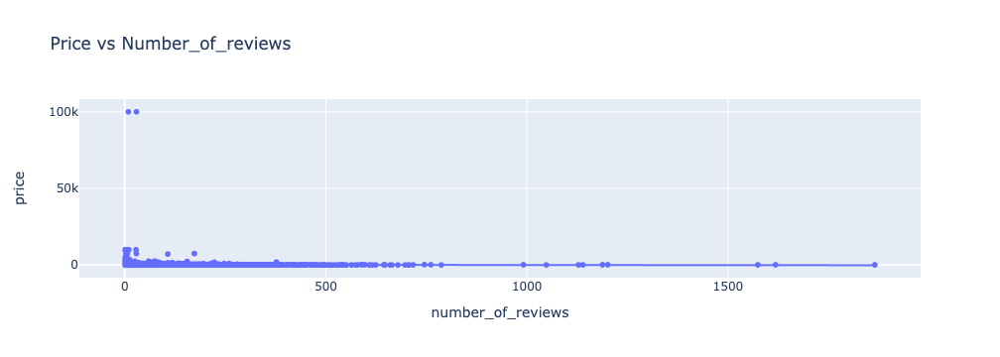

In [101]:
# scatter plot showing that when price is low then no of reviews are more
fig = px.scatter(df, x = "number_of_reviews", y = "price", trendline = "ols", title = "Price vs Number_of_reviews")
fig.show()

In [102]:
# Knowing unique values in minimum_nights column
unique_minimum_nights = df['minimum_nights'].unique()
unique_minimum_nights

array([  30,    2,  180,    1,   90,  365,  700,   31,   60,   75,    3,
          5,    7,    4,   45,  145,   85,   65,    6, 1000,   35,  360,
        200,  400,    9,  250,  100,   93,  115,   15,   19,   40,   33,
         64,  300,   95,  500,  120,   80, 1250,   50,   59,  364,   25,
        150,   32,  125,   48,   61,   55,   14,   70,  186,   42,   58,
       1124,  265,   23,   10,  273,  182,   28,  307,   99,   78,   34,
         20,  183,   62])

In [103]:
# Finding the maximum value from the minimum_nights column
unique_minimum_nights.max()

1250

In [104]:
# Knowing the hotel name which held minimum_nights as highest 
df[df['minimum_nights'] == 1250]

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,bedrooms,beds,baths
3383,Rental unit in New York,Genevieve,Manhattan,Greenwich Village,40.73293,-73.99782,Entire home/apt,180,1250,2,2014-09-11,0.02,1,0,0,0,4.73,1,1,1


In [105]:
# Sorting the values of top 10% of the minimum_nights
top_10_max_values = sorted(unique_minimum_nights, reverse=True)[:10]
top_10_max_values

[1250, 1124, 1000, 700, 500, 400, 365, 364, 360, 307]

In [106]:
# Top 10% hotels according to minimum_nights
matching_rows = df[df['minimum_nights'].isin(top_10_max_values)]
matching_rows

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,bedrooms,beds,baths
38,Rental unit in New York,James,Manhattan,Midtown,40.752820,-73.973150,Entire home/apt,125,365,19,2015-08-09,0.13,1,0,0,0,4.11,1,1,1
77,Condo in New York,Eddie,Manhattan,West Village,40.733143,-74.009605,Entire home/apt,200,700,7,2023-11-18,0.25,1,95,5,0,4.86,1,1,1
484,Condo in Brooklyn,Eli,Brooklyn,Williamsburg,40.708730,-73.965180,Entire home/apt,179,365,43,2022-09-18,1.61,1,365,0,0,4.84,3,3,1
532,Rental unit in Queens,Serdar,Queens,Ridgewood,40.701840,-73.909570,Private room,32,365,28,2021-03-31,0.32,2,269,0,0,4.79,2,1,1
583,Home in Queens,Albert,Queens,Ditmars Steinway,40.778638,-73.907268,Private room,85,1000,21,2023-10-11,1.75,4,365,21,0,4.33,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18370,Rental unit in Brooklyn,Emi,Brooklyn,Bedford-Stuyvesant,40.678794,-73.909555,Private room,65,365,2,2023-05-09,0.27,10,365,2,0,4.73,1,2,1
18552,Rental unit in Brooklyn,Emi,Brooklyn,Bedford-Stuyvesant,40.679029,-73.909080,Private room,42,364,3,2023-09-06,0.37,10,365,3,0,4.33,1,1,1
18589,Rental unit in Brooklyn,Laura,Brooklyn,Crown Heights,40.670420,-73.948390,Private room,50,500,10,2016-09-22,0.10,1,364,0,0,4.60,1,1,1
18603,Rental unit in Brooklyn,Emi,Brooklyn,Bedford-Stuyvesant,40.678830,-73.907380,Private room,70,365,2,2023-06-18,0.26,10,365,2,0,4.73,1,2,1


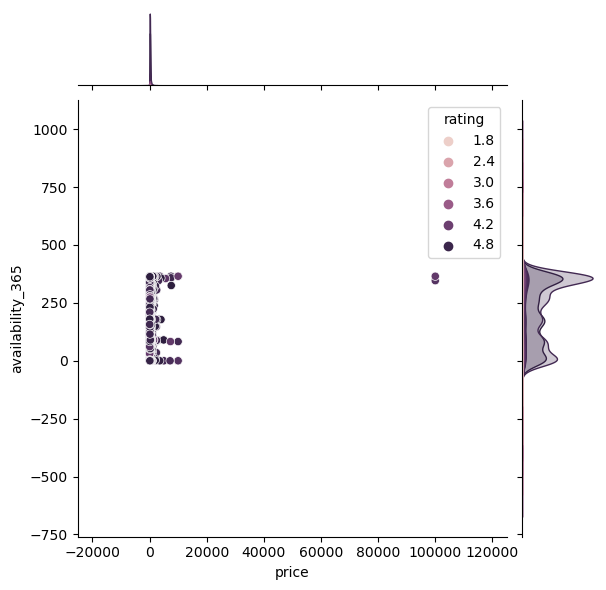

In [107]:
# Joint Plot
sns.jointplot(data=df, x='price', y='availability_365', kind='scatter', hue='rating')
plt.show()

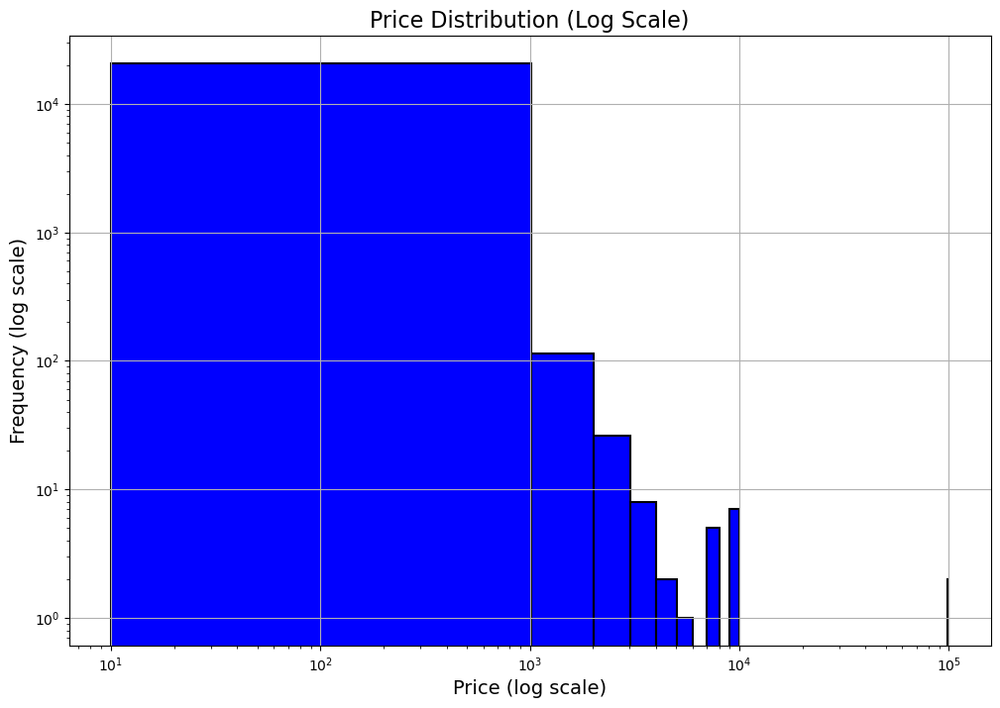

In [108]:
# Plotting histogram to check the price distribution
plt.figure(figsize = (12, 8))
plt.xscale('log')
plt.yscale('log')
df.price.hist(bins = 100, color = "blue", edgecolor = "black", linewidth = 1.5)

plt.title("Price Distribution (Log Scale)", fontsize = 16)
plt.xlabel("Price (log scale)", fontsize = 14)
plt.ylabel("Frequency (log scale)", fontsize = 14)
plt.show()

This histogram of price distribution on a log-log scale provides several insights:  
- __Price Range and Distribution__  
Using a log scale for both the x-axis (price) and y-axis (frequency) helps visualize data over a wide range,   
revealing insights into both high and low prices.  
- __Presence of Outliers__  
Any visible long "tail" on the right side of the plot indicates that some prices are exceptionally high,
suggesting the presence of outliers.  
- __Distribution Shape__
If the histogram has a peak on the left, it shows a larger volume of low-priced items,  
common in consumer goods where most items fall within a budget range.  
- __Data Spread__  
The width of the histogram’s bins reveals the spread of the prices; wide bins across the log scale imply a more varied price distribution,  
whereas narrower bins might show prices clustered within specific ranges.  

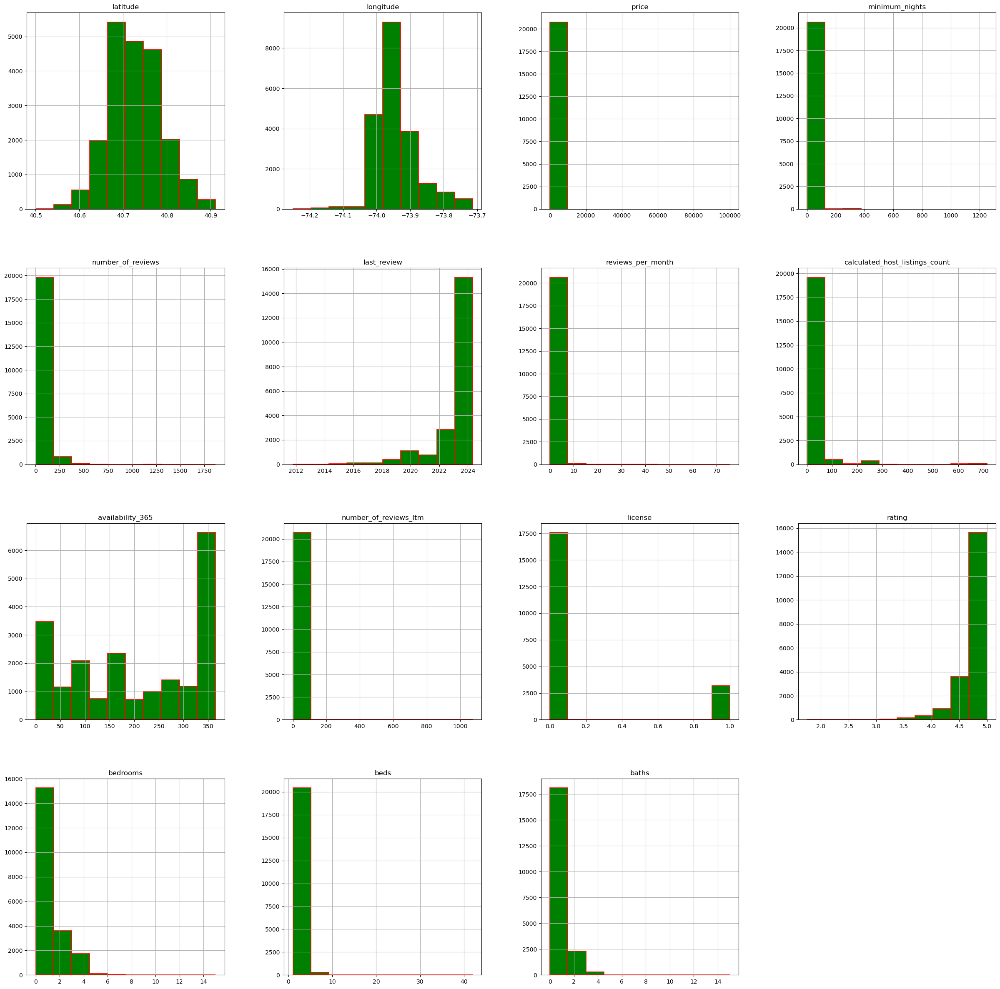

In [110]:
# Consecutive histograms for understanding the each column's distribution more clearly
df.hist(color = "green", edgecolor = "red", linewidth = 1.2, figsize = (30, 30));

This set of histograms provides a quick overview of each column's distribution,   
highlighting where values cluster and indicating any skewness or outliers in the data.   
It helps identify patterns across variables, such as concentration ranges and variability within each feature.  

In [112]:
# Retrieving the unique values of license column
df['license'].unique()

array([0, 1])

In [113]:
# Finding the total no of entries for hotels having license or not
(df['license'] == 1).sum(), (df['license'] == 0).sum()

(3189, 17569)

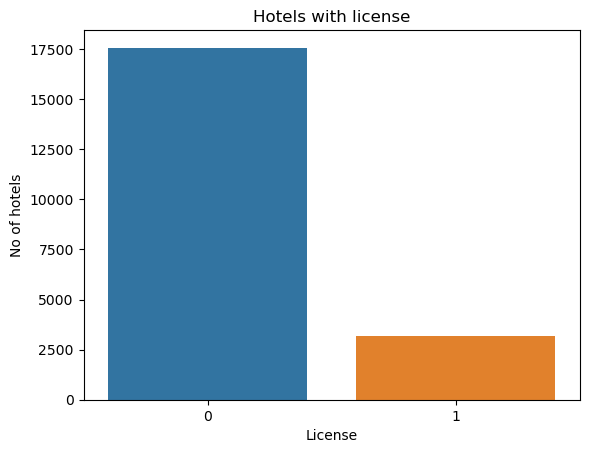

In [114]:
# Plotting the countplot for the license column
sns.countplot(df, x = "license")
plt.xlabel('License')
plt.ylabel('No of hotels')
plt.title('Hotels with license')
plt.show()

From the above graph we can find that the hotels which doesn't have license are more.    
The count of the hotels which have licese are 3189 and which doesn't have license are 17569.  

In [116]:
# Getting the unique values in neighbourhood_group column
df['neighbourhood_group'].unique()

<StringArray>
['Brooklyn', 'Manhattan', 'Queens', 'Bronx', 'Staten Island']
Length: 5, dtype: string

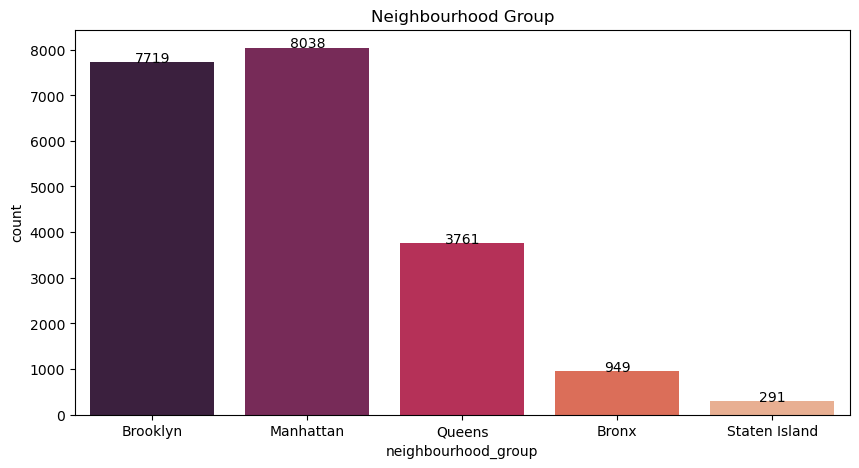

In [117]:
# Ploting the countplot for neighbourhood_group and count of the values 
plt.figure(figsize = (10, 5))
sns.countplot(data = df, x = 'neighbourhood_group', palette = 'rocket')
plt.title('Neighbourhood Group')

for p in plt.gca().patches:
    plt.text(
        p.get_x() + p.get_width() / 2,
        p.get_height() + 5,
        int(p.get_height()),
        ha = 'center'
    )

plt.show()

The countplot reveals the distribution of listings across different neighborhood groups,   
showing which areas have higher or lower concentrations of listings.   
The annotated counts on top of each bar provide precise values, making it easy to compare neighborhood popularity directly.   

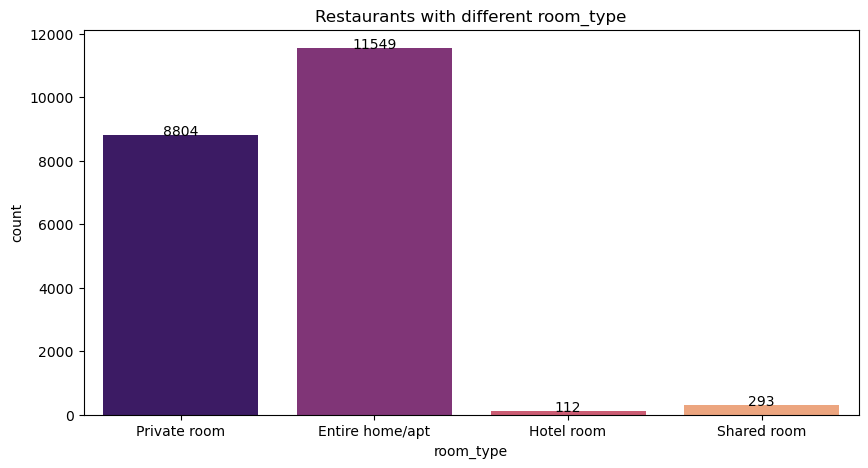

In [119]:
# Ploting the countplot for room_type and count of the values 
plt.figure(figsize=(10, 5))
sns.countplot(data = df, x = 'room_type', palette = "magma")
plt.title('Restaurants with different room_type')

for p in plt.gca().patches:
    plt.text(
        p.get_x() + p.get_width() / 2,
        p.get_height() + 5,
        int(p.get_height()),
        ha='center'
    )

plt.show()

This countplot highlights the distribution of listings across different room types,   
showing which type (e.g., entire home/apt, private room, hotel room, shared room) is most common.   
The labeled counts on each bar make it easy to compare the popularity of each room type directly.  
From this we can say that "Entire home/apt" is mostly popular among all of them from the above graph.  

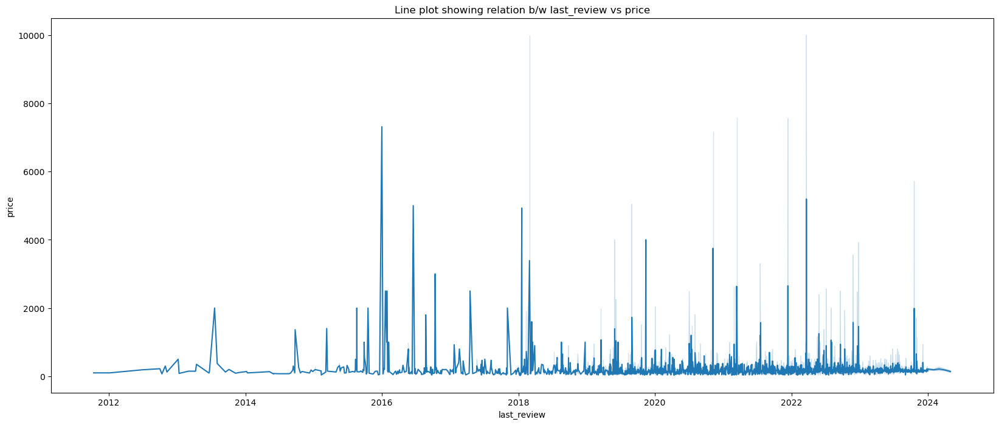

In [121]:
# Ploting line chart between last_review and price
plt.figure(figsize = (20, 8))
sns.lineplot(data = df, x = "last_review", y = "price")
plt.title("Line plot showing relation b/w last_review vs price")
plt.show()

The line chart visualizes the relationship between last_review dates and price.   
It highlights how prices fluctuate over time, potentially revealing trends, seasonal effects, or changes in demand.   
Any sharp peaks or drops in the chart might indicate specific events or outliers affecting pricing.  

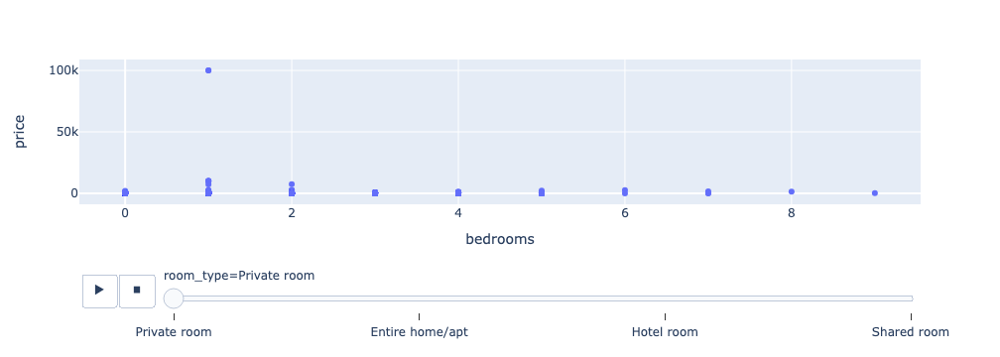

<Figure size 2000x700 with 0 Axes>

In [123]:
# Scatter plot for the room_type and bedrooms with price
plt.figure(figsize = (20, 7))
px.scatter(df, x = "bedrooms",y = "price", animation_frame = "room_type")

This scatter plot illustrates how price varies with the number of bedrooms across different room types,   
revealing trends such as higher prices for listings with more bedrooms.   
The animation by room type allows for easy comparison,   
showing how price distribution differs between entire homes, private rooms, and other room types.  

<Axes: xlabel='bedrooms', ylabel='price'>

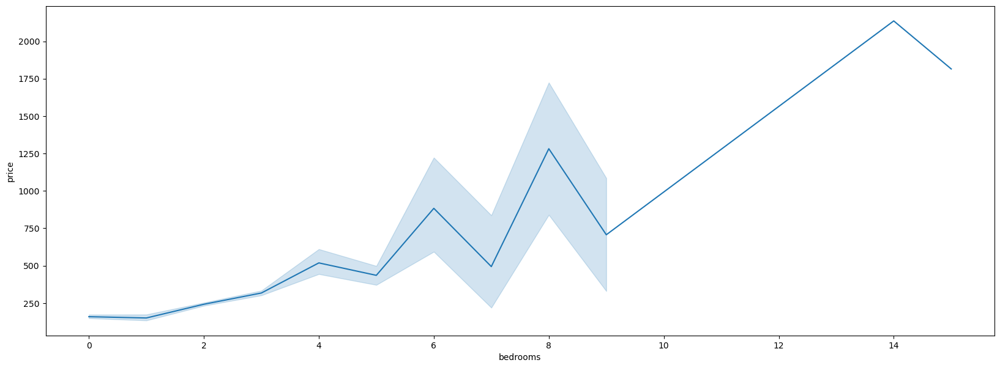

In [125]:
# Scatter plot distribution for the no of bedrooms with price
plt.figure(figsize = (20, 7))
sns.lineplot(data = df, x = "bedrooms", y = "price")

This line plot shows the relationship between the number of bedrooms and price,   
indicating that as the number of bedrooms increases, the price generally trends upwards.   
The plot may reveal pricing patterns and anomalies for properties with certain bedroom counts.  

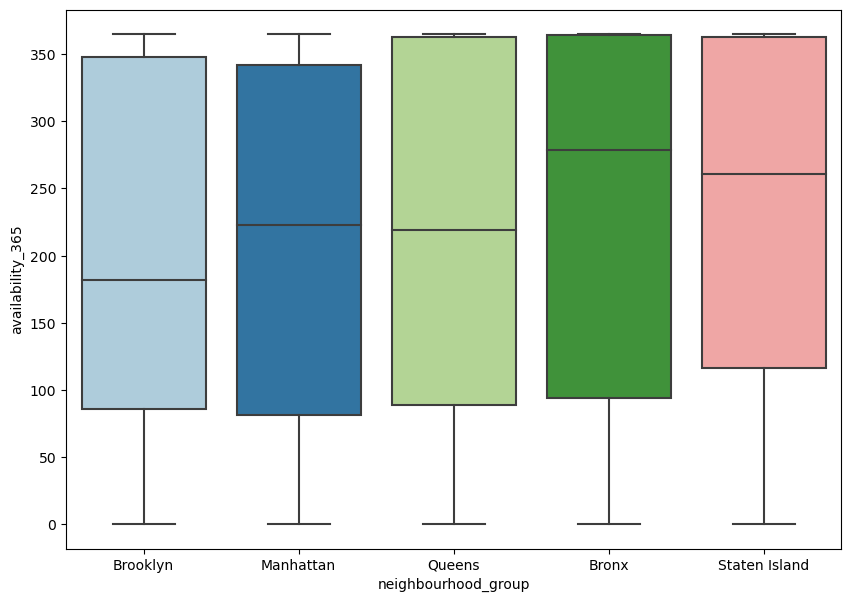

In [127]:
# Ploting boxplot between availability_365 and neighbourhood_group
plt.figure(figsize=(10, 7))
sns.boxplot(data = df, x = 'neighbourhood_group', y = 'availability_365', palette = 'Paired')
plt.show()

The boxplot illustrates the distribution of availability across different neighborhood groups,   
showing variability in the number of days listings are available throughout the year.   
It highlights potential outliers and differences in availability between neighborhoods,   
with some groups having more consistent availability than others.   

In [129]:
# Retrieving the rows having 5 rating in the dataset and storing it in df_rating
df_rating = df[df['rating'] == 5.0]
df_rating

,name,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,bedrooms,beds,baths
0,Rental unit in Brooklyn,Walter,Brooklyn,Clinton Hill,40.683710,-73.964610,Private room,55,30,3,2015-12-20,0.03,1,0,0,0,5.0,1,1,0
5,Rental unit in New York,Jeniffer,Manhattan,Hell's Kitchen,40.759950,-73.992960,Entire home/apt,115,30,5,2023-07-29,0.16,139,276,2,0,5.0,1,1,1
21,Rental unit in Brooklyn,David,Brooklyn,Bushwick,40.704770,-73.926710,Entire home/apt,220,30,12,2020-05-01,0.21,1,0,0,0,5.0,2,2,1
30,Rental unit in Brooklyn,Ivan,Brooklyn,Williamsburg,40.712650,-73.965390,Private room,106,30,8,2023-09-15,0.22,1,15,5,0,5.0,1,1,1
36,Rental unit in Queens,Abeer,Queens,East Elmhurst,40.763660,-73.861330,Private room,99,30,6,2022-02-20,0.18,6,0,0,0,5.0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20722,Rental unit in New York,Lena,Manhattan,Upper West Side,40.772800,-73.985830,Entire home/apt,293,30,6,2023-11-15,0.10,5,53,3,0,5.0,1,1,1
20732,Rental unit in New York,Constantin,Manhattan,Gramercy,40.734087,-73.983887,Entire home/apt,85,30,6,2023-12-18,0.59,4,0,6,0,5.0,0,1,1
20743,Rental unit in New York,Nicholas,Manhattan,Chelsea,40.740781,-73.997715,Entire home/apt,281,30,3,2023-12-23,0.86,1,278,3,0,5.0,1,1,1
20750,Rental unit in New York,Freddy,Manhattan,Lower East Side,40.716593,-73.987383,Private room,79,30,6,2023-07-31,0.49,1,180,4,0,5.0,1,1,0


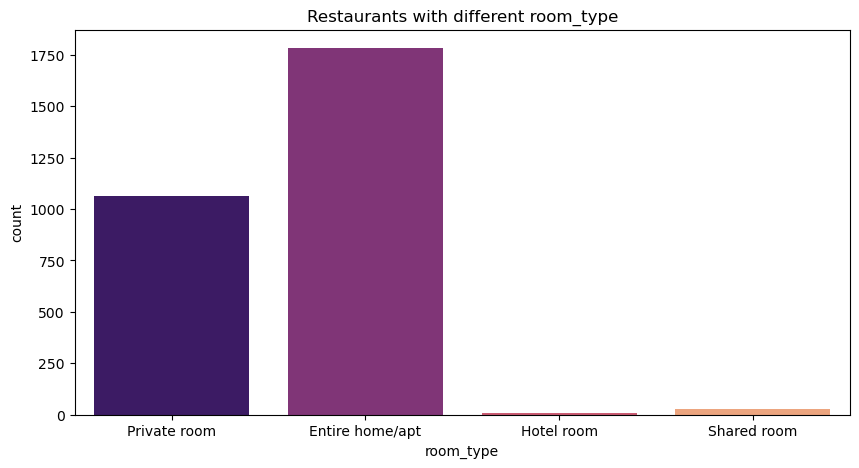

In [130]:
# Ploting countplot as per rating in the dataset
sns.countplot(data = df_rating, x = 'room_type', palette = "magma")
fig = plt.gcf()
fig.set_size_inches(10, 5)
plt.title('Restaurants with different room_type')
plt.show()

The countplot shows the distribution of room types in the dataset,   
revealing how different room types are represented across the data.   
It helps identify the most and least common room types,   
such as entire homes versus private rooms, in terms of frequency.  
We observe the same as normal data while plotting data with 5 rating  
"Entire home/apt" is again the popular room_type in 5 rating data also.  

In [132]:
# Finding the unique values room_type
df['room_type'].unique()

<StringArray>
['Private room', 'Entire home/apt', 'Hotel room', 'Shared room']
Length: 4, dtype: string

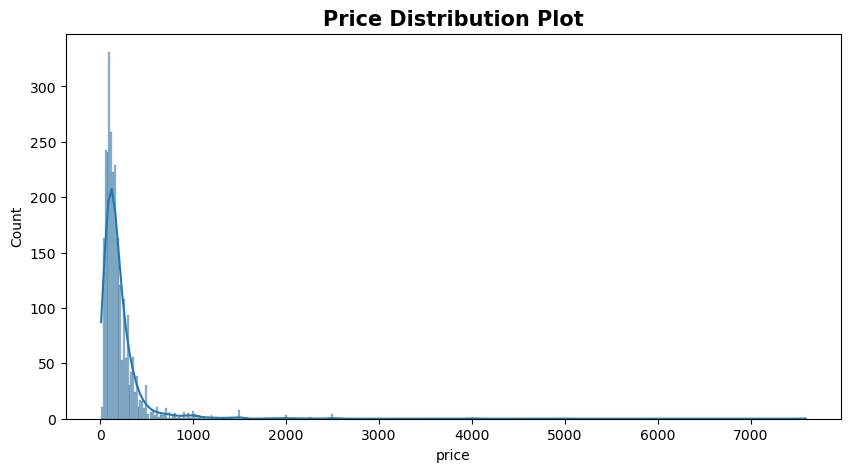

In [133]:
# Plotting histogram for price distribution with count
sns.histplot(data = df_rating['price'], kde = True)
fig = plt.gcf()
fig.set_size_inches(10, 5)
plt.title("Price Distribution Plot",size=15, weight='bold')
plt.show()

The histogram shows the distribution of prices with a kernel density estimate (KDE),   
providing insights into the overall price range and its skewness.   
It reveals whether the prices are normally distributed   
or if there are more frequent low-priced listings compared to higher-priced ones.  

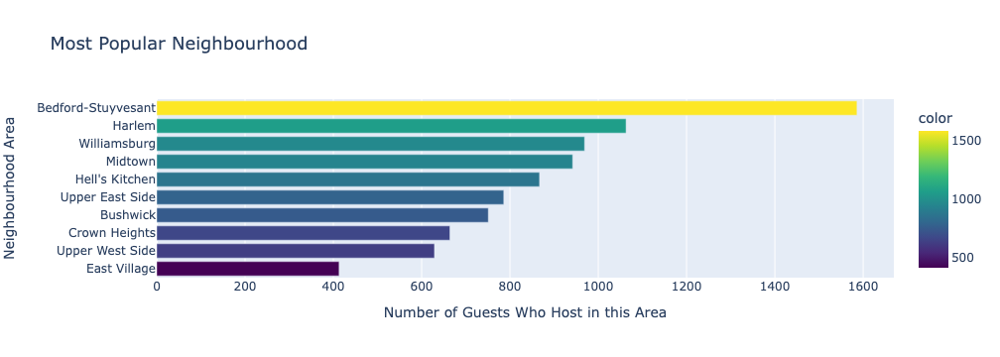

In [135]:
# Plotting the bar graph to find the most popular neighbourhood using plotly library
data = df.neighbourhood.value_counts()[:10]
x = list(data.index)
y = list(data.values)
x.reverse()
y.reverse()

fig = px.bar(x = y, y = x, orientation = 'h', title = "Most Popular Neighbourhood", 
             labels = {'x': 'Number of Guests Who Host in this Area', 'y': 'Neighbourhood Area'}, 
             color = y, color_continuous_scale = "Viridis"
)

fig.update_layout(xaxis_title = "Number of Guests Who Host in this Area", yaxis_title = "Neighbourhood Area", title_font_size=18)
fig.show()

The bar graph highlights the top 10 most popular neighborhoods   
based on the number of guests who host in these areas,   
with the data visualized in descending order.   
It provides a clear view of neighborhood popularity,   
showing which areas attract the most hosts and guests.   

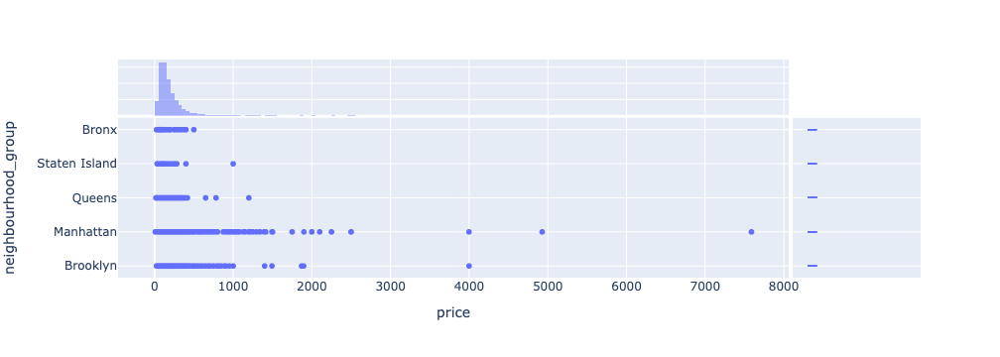

In [137]:
# Plotting scatter plot and histogram combined using plotly library
fig = px.scatter(df_rating, x = "price", y = "neighbourhood_group", marginal_x = "histogram", marginal_y = "rug")
fig.show()

The combined scatter plot and histogram visualize the relationship between price and neighbourhood_group,   
while also showing the price distribution and density.   
The scatter plot highlights variations in pricing across different neighborhoods,   
while the marginal histogram reveals the concentration of prices.   
The rug plot further emphasizes price clustering or spread within specific neighborhoods.  

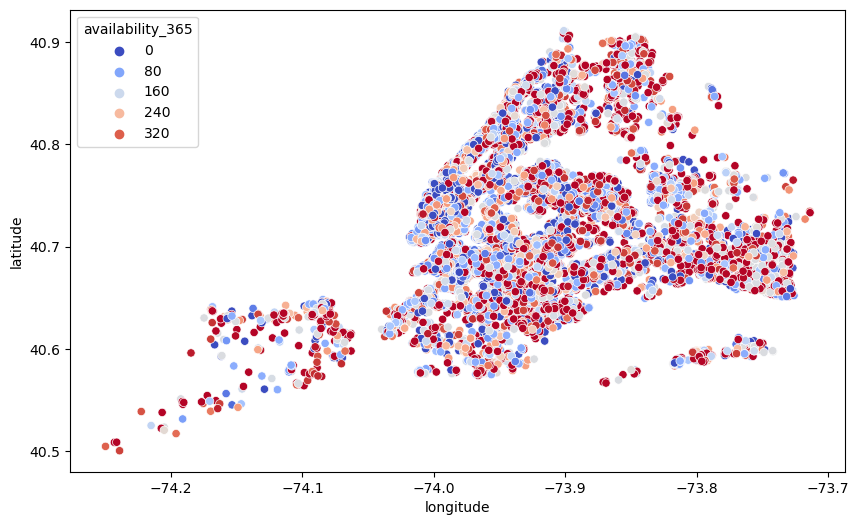

In [139]:
# Scatter plot using longitude, latitude with hue as availability_365
plt.figure(figsize = (10, 6))
sns.scatterplot(data = df, x = 'longitude', y = 'latitude', hue = 'availability_365', palette = "coolwarm")
plt.show()

The scatter plot visualizes the geographical distribution of listings based on longitude and latitude,   
with color indicating the availability throughout the year.   
It shows how the availability of listings is spread across different locations,   
highlighting areas with higher or lower availability.  

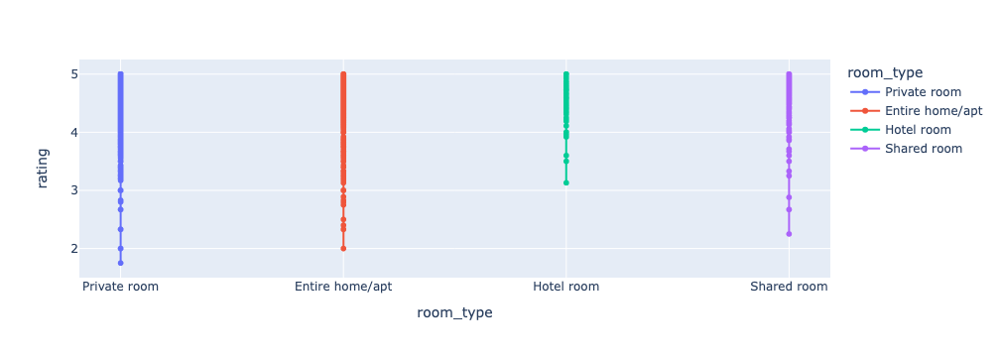

In [141]:
# Plotting line chart using room_type, rating and color as room_type
fig = px.line(df, x = "room_type", y = "rating", color = "room_type", markers = True)
fig.show()

The line chart shows the variation in ratings across different room types,   
highlighting how room types are rated differently by users.   
It provides insights into which room types generally receive higher or lower ratings,   
helping to identify trends in guest satisfaction based on the type of accommodation.  

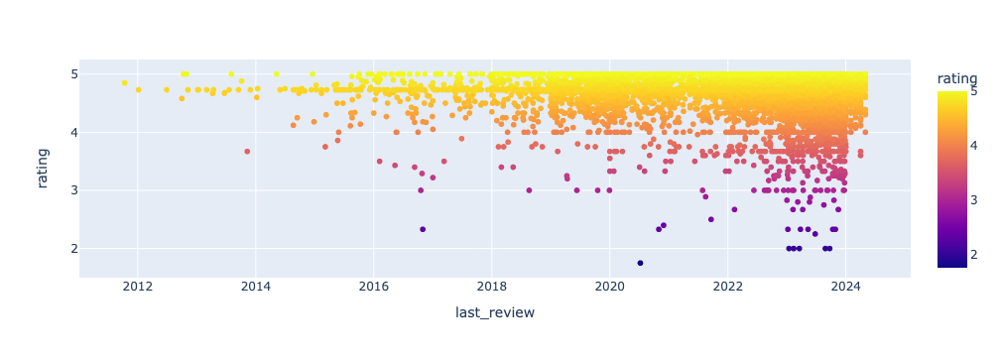

In [143]:
# Plotting scatter plot according to the last_review and rating
fig = px.scatter(df, x = "last_review", y = "rating", color = "rating")
fig.show()

The scatter plot illustrates the relationship between the date of the last review and the ratings,   
with color indicating the rating levels.    
It reveals whether more recent reviews correlate with higher or lower ratings,   
highlighting trends in guest feedback over time.  

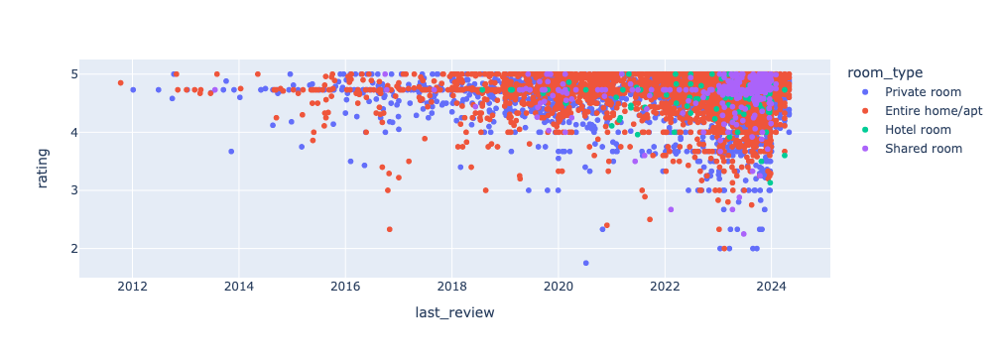

In [145]:
# Plotting scatter plot according to the last_review and room_type
fig = px.scatter(df, x = "last_review", y = "rating", color = "room_type")
fig.show()

The scatter plot shows the relationship between the date of the last review and the rating,  
with points colored by room type.   
It helps identify how different room types are rated over time,   
revealing patterns in guest satisfaction and review frequency across room categories.  

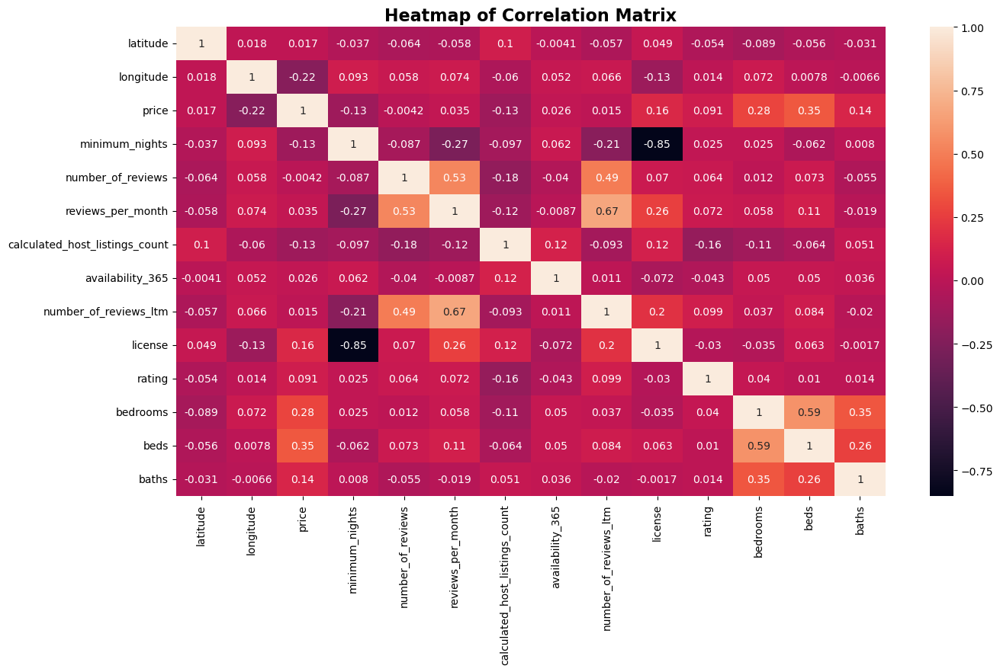

In [147]:
# Heatmap for the entire data
corr = df.corr(method = 'kendall')
plt.figure(figsize = (15, 8))
sns.heatmap(corr, annot = True)
plt.title("Heatmap of Correlation Matrix", fontsize=16, weight='bold')
plt.savefig("heatmap.png")
plt.show()

The heatmap visualizes the correlations between different numerical features   
in the dataset using Kendall’s method, highlighting relationships between variables.   
It helps identify which features are strongly or weakly correlated,   
providing insights into potential dependencies and associations within the data.  
From this heatmap we can notice that there is a strong between minimum_nights and license,   
there is a relation between reviews_per_month and number_of_reviews_Itm,  
there is a relation between beds and bedrooms,
there is a relation between number_of_reviews and number_of_reviews_Itm,